# Monte Carlo Metropolis: Testing for Convergence #

In [1]:
import numpy as np
from tqdm.notebook import tqdm

def metropolis_1D(U, T, x0, dx, nsteps):
    '''
    Perform Metropolis Monte Carlo on a 1D system with a predefined potential

    Parameters
    ----------
    U : function(float) --> float
        A function that calculates the potential for a given value of x
    T : float
        Temperature in K
    x0 : float or tuple(float, float)
        The initial x position or the domain in which to get random initial x position
    dx : float
        The standard deviation of the normal distribution to sample random numbers from
    nsteps : int
        The number of monte carlo steps to take

    Returns
    -------
    xvalues : np.ndarray(dtype=float)
        The x positions at each step
    uvalues : np.ndarray(dtype=float)
        The potential values at each step
    steps : numpy.ndarray(dtype=int)
        The step numbers
    '''
    rng = np.random.default_rng() # Using 64-bit Permuted Congruential Generator
    if isinstance(x0, tuple):
        x0 = rng.uniform(x0[0], x0[1])

    steps = np.arange(0, nsteps+1, 1, dtype=int)
    xvalues = np.zeros_like(steps, dtype=float)
    uvalues = np.zeros_like(steps, dtype=float)
    xvalues[0] = x0 
    uvalues[0] = U(x0)
    
    k=0.001987204259
    for i in tqdm(steps[1:], desc=f"Metropolis, {T}K"):
        xvalues[i] = xvalues[i-1]+rng.uniform(-dx/2, dx/2) # Random step
        uvalues[i] = U(xvalues[i]) # potential after random step
        random = rng.uniform(0, 1) # random acceptance probability  
        if np.exp((-uvalues[i]+uvalues[i-1])/(k*T)) <= random:
            xvalues[i] = xvalues[i-1]
            uvalues[i] = uvalues[i-1]
    
    return xvalues, uvalues, steps

## Time Average and Time Variance ##

In [2]:
def time_average_and_variance(A, t, N):
    '''
    Calculate time average and variance
    
    Parameters
    ----------
    A : np.ndarray
        The observable over time
    t : np.ndarray
        The times corresponding to each element in A
    N : int
        The step size
    
    Returns
    -------
    time : np.ndarray
        The time midpoints corresponding to each value in the running average and running variance arrays
    average : np.ndarray
        The running averages
    variance : np.ndarray
        The running variances
    '''
    steps = np.arange(2, A.size, N)
    time = t[2::N]
    average = np.zeros_like(time, dtype=float)
    variance = np.zeros_like(time, dtype=float)

    for i, s in enumerate(tqdm(steps, desc="Time Average & Variance")):
        # calculate average up to current time
        average[i] = np.mean(A[:s])
        # calculate variance up to current time
        variance[i] = np.var(A[:s])

    return time, average, variance

## Hamming Metric ##

In [3]:
def exact_probability(U, xvals, T):
    '''
    Get the exact probability density for a given potential and temperature

    Parameters
    ----------
    U : function(float) --> float
        The potential function
    xvals : np.ndarray
        The x positions in which to compute teh probability density
    T : float
        The temperature in Kelvin
    
    Returns
    -------
    rhox : np.ndarray
        The probability density
    '''
    Ux = U(xvals) # Calculate potential 
    k=0.001987204259 # Bolzmann Constant (kcal/molK)
    rhox = np.exp(-Ux/(k*T)) # probability distribution
    integral = np.trapz(rhox, xvals) # get normalization factor
    rhox = rhox/integral # convert to density
    return rhox

def hamming_metric(A, t, x, E, N):
    ''' 
    Compute the Hamming Metric

    Parameters
    ----------
    A : np.ndarray
        The observable
    t : np.ndarray
        The times corresponding to each element in A 
    x : np.ndarray
        The bin centers for the PDFs
    E : np.ndarray
        The exact PDF value for each element in x
    N : int
        The step size
    
    Returns
    -------
    time : np.ndarray
        The times for each element in hamming
    hamming : np.ndarray 
        The hamming metric computed with datapoints up to correspnding time in T
    '''
    steps = np.arange(2, A.size, N)
    time = t[2::N]
    hamming = np.zeros_like(time, dtype=float)
    halfbin = (x[1]-x[0])/2
    xe = np.hstack([x-halfbin, x[-1]+halfbin]) # The bin edges to use for computing the PDFs
    
    for i, s in enumerate(tqdm(steps, desc="Hamming Metric")):
        Axt, _ = np.histogram(A[:s], xe, density=True) # Compute PDF
        hamming[i] = np.trapz((Axt-E)**2, x) # Compute Hamming

    return time, hamming

In [4]:

potential_quartic = lambda x: 6.7*x**4 + x**3 - 2.6*x**2

xvalues10, uvalues10, steps10 = metropolis_1D(potential_quartic, 10, -0.5, 0.1, 2000000)
rtime10, raverage10, rvariance10 = time_average_and_variance(xvalues10, steps10, 1000)
bincenters10 = np.linspace(-1, 1, 1001)
rhoE10 = exact_probability(potential_quartic, bincenters10, 10)
htime10, hamming10 = hamming_metric(xvalues10, steps10, bincenters10, rhoE10, 1000)

xvalues120, uvalues120, steps120 = metropolis_1D(potential_quartic, 120, -0.5, 0.1, 2000000)
rtime120, raverage120, rvariance120 = time_average_and_variance(xvalues120, steps120, 1000)
bincenters120 = np.linspace(-1, 1, 1001)
rhoE120 = exact_probability(potential_quartic, bincenters120, 120)
htime120, hamming120 = hamming_metric(xvalues120, steps120, bincenters120, rhoE120, 1000)

Metropolis, 10K:   0%|          | 0/2000000 [00:00<?, ?it/s]

Time Average & Variance:   0%|          | 0/2000 [00:00<?, ?it/s]

Hamming Metric:   0%|          | 0/2000 [00:00<?, ?it/s]

Metropolis, 120K:   0%|          | 0/2000000 [00:00<?, ?it/s]

Time Average & Variance:   0%|          | 0/2000 [00:00<?, ?it/s]

Hamming Metric:   0%|          | 0/2000 [00:00<?, ?it/s]

In [5]:
%%capture
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import matplotlib.animation as animation
import functools
from IPython.display import HTML

def animated_plot(xvalues, uvalues, steps, TEMP):
    fig = plt.figure(figsize=(6.5, 6))
    gs = plt.GridSpec(ncols=1, nrows=2, height_ratios=[6, 6], hspace=0.1,
                      bottom=0.1, top=0.99, left=0.12, right=0.99)

    ax = [fig.add_subplot(gs[0])]
    ax = ax + [fig.add_subplot(gs[1], sharex=ax[0])]
    
    ax[0].axhline(0, linewidth=0.75, color="k")
    x = np.linspace(-1, 1, 1000)
    y = potential_quartic(x)
    ax[0].plot(x, y, color="k")
    vmarker, = ax[0].plot(xvalues[0], uvalues[0], color="tab:blue", markersize=4, marker="o")
    ax[0].set_ylim(y.min()*1.1, y.max()*1.1)
    ax[0].set_ylabel(r"$V_{q}(x)$")
    ax[0].set_xlabel(r"$x$")
    ax[0].set_ylim(-0.5, 1.5)

    HIST_BINS = np.arange(xvalues.min(), xvalues.max(), 0.01)
    ax[1].axhline(0, linewidth=0.75, color="k")
    _, _, bar_container = ax[1].hist([xvalues[0]], HIST_BINS, density=True)
    ax[1].plot(x, exact_probability(potential_quartic, x, TEMP), color="k")
    ax[1].set_ylabel(r"$\rho(x)$")
    ax[1].set_xlabel(r"$x$")

    def run(i, bar_container):
        '''
        Function passed to FuncAnimation to update plot
        '''
        vmarker.set_data([xvalues[i]], [uvalues[i]])

        n, _ = np.histogram(xvalues[:i+1], HIST_BINS, density=True)
        for count, rect in zip(n, bar_container.patches):
            rect.set_height(count)
        ax[1].set_ylim(0,np.max((n.max()*1.1, 0.5)))
        return vmarker, bar_container.patches

    run_set = functools.partial(run, bar_container=bar_container)
    ani = animation.FuncAnimation(fig, run_set, frames=np.arange(1, len(xvalues), 20000), interval=300)
    return ani

In [6]:
%%capture
ani10 = animated_plot(xvalues10, uvalues10, steps10, 10).to_jshtml()

In [7]:
HTML(ani10)

In [8]:
%%capture
ani120 = animated_plot(xvalues120, uvalues120, steps10, 120).to_jshtml()

In [9]:
HTML(ani120)

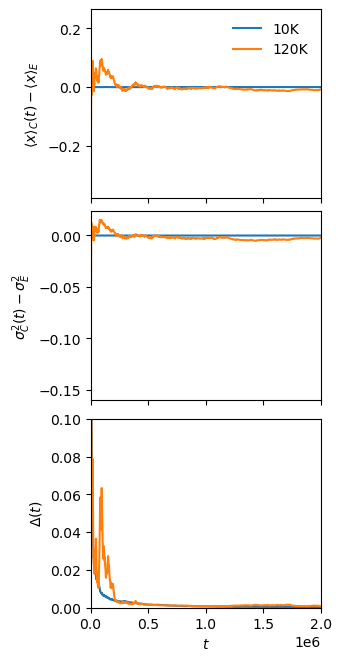

In [11]:
fig, ax = plt.subplots(nrows=3, figsize=(3.3, 6.5), sharex=True, constrained_layout=True)

# Average
avE10 = np.average(bincenters10, weights=rhoE10)
avE120 = np.average(bincenters120, weights=rhoE120)
ax[0].plot(rtime10, raverage10-avE10, label="10K")
ax[0].plot(rtime120, raverage120-avE120, label="120K")
ax[0].set_ylabel(r"$\langle x \rangle_C (t) - \langle x \rangle_E$")
ax[0].legend(frameon=False)

# Variance
varE10 = np.average((bincenters10-np.average(bincenters10, weights=rhoE10))**2, weights=rhoE10)
varE120 = np.average((bincenters120-np.average(bincenters120, weights=rhoE120))**2, weights=rhoE120)
ax[1].plot(rtime10, rvariance10-varE10, label="10K")
ax[1].plot(rtime120, rvariance120-varE120, label="120K")
ax[1].set_ylabel(r"$\sigma_C^2 (t) - \sigma_E^2$")

# Hamming
ax[2].plot(htime10, hamming10, label="10K")
ax[2].plot(htime10, hamming120, label="120K")
ax[2].set_ylabel(r"$\Delta(t)$")
ax[2].set_xlabel(r"$t$")
ax[2].set_ylim(0, 0.1)
ax[2].set_xlim(0,2000000)

plt.show()